In [19]:
import xarray as xr
import netCDF4 as nc
import plotly
import chart_studio.plotly as py
import plotly.offline as py_off
import numpy as np
from scipy.io import netcdf
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'iframe'
import cartopy.feature as cf
import dash
import dash_core_components
import matplotlib
from __future__ import print_function
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.animation as anim
import cartopy
from IPython.display import HTML
from PIL import Image

In [20]:
def get_plotly_data(file,field,level=None):
    ds = xr.open_dataset(xr.backends.NetCDF4DataStore(nc.Dataset(file)))
    df = ds[['lon','lat',f'{field}']].to_dataframe()

    if level is not None:
        levels = df.index.get_level_values('pfull')
        level = levels[np.argmin(np.abs(levels-level))]
        df = df[df.index.get_level_values('pfull') == level]
    
    step = 1.0
    to_bin = lambda x: np.floor(x / step) * step
    df["lat"] = df.index.get_level_values('lat').map(to_bin)
    df["lon"] = df.index.get_level_values('lon').map(to_bin)
    
    df.reset_index(drop=True, inplace=True)
    
    groups = df.groupby(["lat", "lon"])
    df_flat = df.drop_duplicates(subset=['lat', 'lon'])
    df = df_flat[np.isfinite(df_flat[f'{field}'])]
    df = df[(df.lat <= 90.0) & 
            (df.lat >= -90.0) & 
            (df.lon <= 360.0) & 
            (df.lon >= 0)]
    
    df['lon'] = df['lon'].apply(lambda x: x if x <= 180.0 else x-360.0)
    return df,ds
    

In [66]:
def get_data(files,field,level=None,exp='co2',decode_times=True):
    data = xr.open_mfdataset(files,decode_times=decode_times)
    
    if 'pfull' not in data[field].dims:
        variable = data[field]
    
    else:
        if level is None:
            level = 250
        levels = np.array(data['pfull'].values)
        level = levels[np.argmin(np.abs(levels-level))]
        
        variable = data[field].sel(pfull = level)
    
    if exp == 'co2':
        return variable, data['co2']
    
    else:
        return variable


In [109]:
def get_avg_field(data,vmin=None,vmax=None,exp='co2'):

# Setup the initial plot
    if exp == 'co2':
        co2 = data[1]
        variable = data[0]
    else:
        variable = data

    fig = plt.figure(figsize=(10,5))
    ax = plt.axes(projection=ccrs.PlateCarree())

# Set up levels etc in this call
    #var = variable.mean(dim='time')
    if 'time' in variable.dims:
        avg = variable.mean(dim='time')
    else:
        avg = variable
    image = avg.plot.imshow(ax=ax, transform=ccrs.PlateCarree(), 
                            interpolation='bilinear',cmap="coolwarm", 
                            animated=True, add_colorbar=False)

    cb = plt.colorbar(image, ax=ax, orientation='horizontal', pad=0.05, label=f'{variable.long_name} ({variable.units})')
    
    if vmin is None or vmax is None:
        pass
    else:
        image.set_clim(vmin,vmax)
        
    text = cb.ax.xaxis.label
    font = matplotlib.font_manager.FontProperties(size=16)
    text.set_font_properties(font)
    
# Set up static features - coastlines, political borders etc.
    ax.coastlines()
    if exp == 'co2':
        ax.set_title(f'Time Average, CO2 = {round(co2.values.mean())} ({co2.units})',fontsize=20)
    else:
        ax.set_title(f'Time Average',fontsize=20)

In [98]:
def get_animation(data,vmin=None,vmax=None,exp='co2'):

# Setup the initial plot
    if exp == 'co2':
        co2 = data[1]
        variable = data[0]
    else:
        variable = data

    fig = plt.figure(figsize=(10,5))
    ax = plt.axes(projection=ccrs.PlateCarree())

# Set up levels etc in this call
    #var = variable.mean(dim='time')
    image = variable.mean(dim='time').plot.imshow(ax=ax, transform=ccrs.PlateCarree(), 
                                                  interpolation='bilinear',cmap="coolwarm", 
                                                  animated=True, add_colorbar=False)

    cb = plt.colorbar(image, ax=ax, orientation='horizontal', pad=0.05, label=f'{variable.long_name} ({variable.units})')
    
    if vmin is None or vmax is None:
        pass
    else:
        image.set_clim(vmin,vmax)
        
    text = cb.ax.xaxis.label
    font = matplotlib.font_manager.FontProperties(size=16)
    text.set_font_properties(font)
    
# Set up static features - coastlines, political borders etc.
    ax.coastlines()

    def update(i):
    # Update the plot for a specific time
        #print(t)
        t = variable.time.values[i]
        if exp == 'co2':
            ax.set_title(f'time = {t.strftime("%B %Y")}, co2 = {round(co2.values[i][0])} ({co2.units})',fontsize=20)
        else:
            ax.set_title(f'time = {t.strftime("%B %Y")}',fontsize=20)
            
        image.set_array(variable.sel(time=t))
        return image

# Run the animation, applying `update()` for each of the times in the variable
    
    plt.close()
    animation = anim.FuncAnimation(fig, update, frames=range(len(variable.time)), blit=False)
    return HTML(animation.to_jshtml())

In [99]:
files = ['/data/bnb32/gfdl_data/variable_co2_3x_grey_test_experiment/run{}/atmos_monthly.nc'.format(str(i).zfill(4)) for i in range(1,120)]
data,co2 = get_data(files,'t_surf',exp='co2')

/data/team/conda/envs/isca_post/lib/python3.9/site-packages/xarray/coding/times.py:527: SerializationWarning:

Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range



In [100]:
get_animation([data,co2],vmin=260,vmax=330)

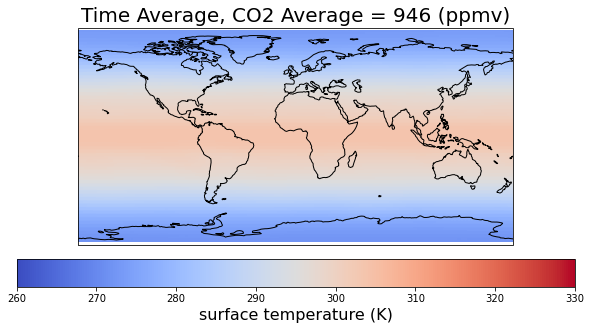

In [97]:
get_avg_field([data,co2],vmin=260,vmax=330)

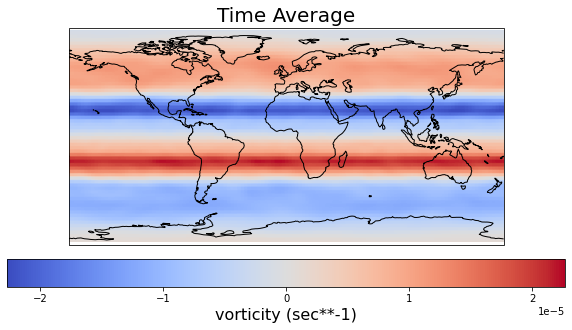

In [46]:
get_avg_field(data)

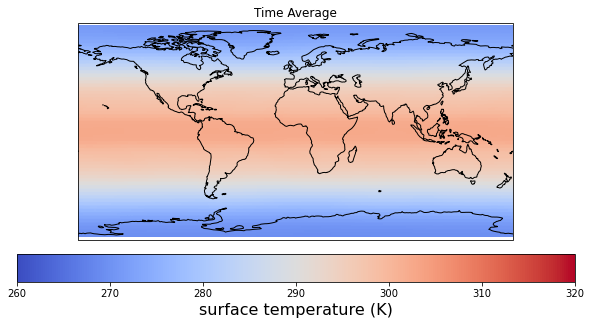

In [40]:
files = ['/data/bnb32/gfdl_data/variable_co2_doubled_grey_test_experiment/run{}/atmos_monthly.nc'.format(str(i).zfill(4)) for i in range(1,120)]
data = get_data(files,'t_surf',None)
get_avg_field(data,260,320)

In [107]:
files = ['/home/ec2-user/environment/isca_aws/experiments/input/land_masks/era_land_t42.nc']
data = get_data(files,'zsurf',None,exp=None)

AttributeError: 'DataArray' object has no attribute 'long_name'

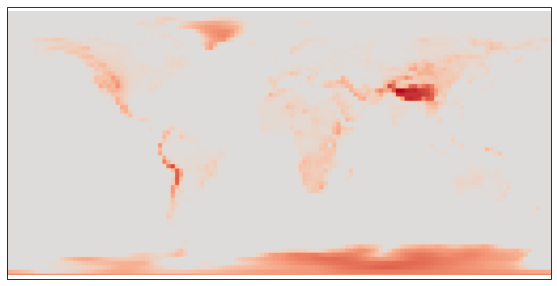

In [110]:
get_avg_field(data,exp=None)

In [106]:
data.shape

(64, 128)

In [23]:
def get_fig_data(file,field,level=None):

    df,ds = get_plotly_data(file,field,level=level)
    
    x_coords = []
    y_coords = []
    traces = []
    for coord_seq in cf.COASTLINE.geometries():
        x_coords.extend([k[0] for k in coord_seq.coords] + [np.nan])
        y_coords.extend([k[1] for k in coord_seq.coords] + [np.nan])  
    
    ## in your app callback for dash
    trace = go.Scatter(x = x_coords,
                       y = y_coords,
                       mode = 'lines',
                       line=go.Line(color="black"))
    traces.append(trace)
    
    contours = go.Contour(z=df[f'{field}'],
                          x=df['lon'],
                          y=df['lat'],
                          colorscale="RdBu",
                          zauto=False,  # custom contour levels
                          zmin=min(df[f'{field}']),      # first contour level
                          zmax=max(df[f'{field}'])        # last contour level  => colorscale is centered about 0
                          )
    data = go.Data([contours]+traces)
    
    title = u"{0} field ({1}) <br>".format(ds[f'{field}'].long_name,ds[f'{field}'].units)

    anno_text = "Data from ISCA simulation"
    #of \
    #<a href='http://www.esrl.noaa.gov/psd/data/composites/day/'>\
    #NOAA Earth System Research Laboratory</a>"

    axis_style = dict(zeroline=False,
                      showline=False,
                      showgrid=False,
                      ticks='',
                      showticklabels=False)

    layout = go.Layout(title=title,
                       showlegend=False,
                       hovermode="closest",        # highlight closest point on hover
                       xaxis=go.XAxis(axis_style,
                                      range=[min(df['lon']),
                                             max(df['lon'])]),  # restrict y-axis to range of lon
    
                       yaxis=go.YAxis(axis_style,
                                      range=[min(df['lat']),
                                             max(df['lat'])]),

                       annotations=go.Annotations([go.Annotation(text=anno_text,
                                                                 xref='paper',
                                                                 yref='paper',
                                                                 x=0,y=1,
                                                                 yanchor='bottom',
                                                                 showarrow=False)]),
                       autosize=False,
                       width=1000,
                       height=600)
    
    #layout = Layout(
    #paper_bgcolor='rgba(0,0,0,0)',
    #plot_bgcolor='rgba(0,0,0,0)'
    #)
    return data,layout
    

In [13]:
def plot_field(file,field,level=None):  
    data,layout = get_fig_data(file,field,level=level)
    fig = go.Figure(data=data,layout=layout)
    fig.show()    

In [30]:
plot_field(files[0],'vor',400)

/data/team/conda/envs/isca_post/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.


/data/team/conda/envs/isca_post/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:31: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.


/data/team/conda/envs/isca_post/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:544: DeprecationWarning:

plotly.graph_objs.XAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.XAxis
  - plotly.graph_objs.layout.scene.XAxis


/data/team/conda/envs/isca_pos

In [31]:
plot_field(files[1],'vor',400)

In [32]:
frames = []
field = 'vor'
level = 400

axis_style = dict(zeroline=False,
                      showline=False,
                      showgrid=False,
                      ticks='',
                      showticklabels=False)

layout = go.Layout(title='',
                       showlegend=False,
                       hovermode="closest",        # highlight closest point on hover
                       xaxis=go.XAxis(axis_style,
                                      range=[min(get_data(files[0],field,level)[0]['lon']),
                                             max(get_data(files[0],field,level)[0]['lon'])]),  # restrict y-axis to range of lon
    
                       yaxis=go.YAxis(axis_style,
                                      range=[min(get_data(files[0],field,level)[0]['lat']),
                                             max(get_data(files[0],field,level)[0]['lat'])]),

                       annotations=go.Annotations([go.Annotation(text='',
                                                                 xref='paper',
                                                                 yref='paper',
                                                                 x=0,y=1,
                                                                 yanchor='bottom',
                                                                 showarrow=False)]),
                       autosize=False,
                       width=1000,
                       height=600,
         updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args = [None, {"frame": {"duration": 1000, 
                                                              "redraw": True},
                                                              "fromcurrent": True, 
                                                              "transition": {"duration": 0,"easing": "quadratic-in-out"}}])])])

for f in files:
    frames.append(go.Frame(data=get_fig_data(f,field,level)[0]))

fig = go.Figure(
    data=get_fig_data(files[0],field,level)[0],
    layout=layout,
    frames=frames
)

fig.show()